In [1]:
import pandas as pd
import numpy as np
import pandas_profiling
import math
from statistics import *
from sklearn.metrics import mean_squared_error
from datetime import datetime
from sklearn.model_selection import KFold, cross_val_score, cross_val_predict
from sklearn import metrics
import matplotlib.pyplot as plt

In [2]:
data = pd.read_csv("C:\\Users\\user\\Documents\\100 Days of ML Coding\\Project - House-pricing\\train.csv")
data.shape

(1460, 81)

In [3]:
data.profile_report()

In [4]:
# checking if have missing values
data.isnull().values.any()

True

In [5]:
data['TotalBath'] = data['FullBath'] + data['HalfBath'] + data['BsmtFullBath']  + data['BsmtHalfBath'] 
data['TotalFlrSF'] = data['1stFlrSF'] + data['2ndFlrSF'] + data['TotalBsmtSF'] 
data = data.drop(['Id'], axis=1)

In [6]:
data_num = data.select_dtypes(include=['int8','int16','int32','int64','float64','float16','float32'])
data_num = data_num.replace(np.nan,0)
data_num.isnull().values.any()

False

In [7]:
data_str = data.select_dtypes(exclude=['int8','int16','int32','int64','float64','float16','float32'])
data_str = data_str.replace(np.nan,"NA")
data_str.isnull().values.any()

False

In [8]:
# create dummies for categorical variables
data_str1 = pd.get_dummies(data_str, prefix_sep="_")
print(data_str1.shape)
data_str1.head()

(1460, 268)


,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_NA,Alley_Pave,...,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0,0,0,1,0,0,1,0,1,0,...,0,0,0,1,0,0,0,0,1,0
1,0,0,0,1,0,0,1,0,1,0,...,0,0,0,1,0,0,0,0,1,0
2,0,0,0,1,0,0,1,0,1,0,...,0,0,0,1,0,0,0,0,1,0
3,0,0,0,1,0,0,1,0,1,0,...,0,0,0,1,1,0,0,0,0,0
4,0,0,0,1,0,0,1,0,1,0,...,0,0,0,1,0,0,0,0,1,0


In [9]:
data1 = data_num.join(data_str1)
data1.shape

(1460, 307)

In [10]:
# remove unique columns
from sklearn.feature_selection import VarianceThreshold
vt = VarianceThreshold(threshold=0.1)
vt.fit(data1)
data2 = data1[data1.columns[vt.get_support(indices=True)]]
print(data2.shape)
print(np.setdiff1d(data1.columns,data2.columns))

(1460, 89)
['Alley_Grvl' 'Alley_NA' 'Alley_Pave' 'BldgType_2fmCon' 'BldgType_Duplex'
 'BldgType_Twnhs' 'BldgType_TwnhsE' 'BsmtCond_Fa' 'BsmtCond_Gd'
 'BsmtCond_NA' 'BsmtCond_Po' 'BsmtCond_TA' 'BsmtExposure_Gd'
 'BsmtExposure_Mn' 'BsmtExposure_NA' 'BsmtFinType1_BLQ' 'BsmtFinType1_LwQ'
 'BsmtFinType1_NA' 'BsmtFinType1_Rec' 'BsmtFinType2_ALQ'
 'BsmtFinType2_BLQ' 'BsmtFinType2_GLQ' 'BsmtFinType2_LwQ'
 'BsmtFinType2_NA' 'BsmtFinType2_Rec' 'BsmtHalfBath' 'BsmtQual_Ex'
 'BsmtQual_Fa' 'BsmtQual_NA' 'CentralAir_N' 'CentralAir_Y'
 'Condition1_Artery' 'Condition1_Feedr' 'Condition1_PosA'
 'Condition1_PosN' 'Condition1_RRAe' 'Condition1_RRAn' 'Condition1_RRNe'
 'Condition1_RRNn' 'Condition2_Artery' 'Condition2_Feedr'
 'Condition2_Norm' 'Condition2_PosA' 'Condition2_PosN' 'Condition2_RRAe'
 'Condition2_RRAn' 'Condition2_RRNn' 'Electrical_FuseA' 'Electrical_FuseF'
 'Electrical_FuseP' 'Electrical_Mix' 'Electrical_NA' 'Electrical_SBrkr'
 'ExterCond_Ex' 'ExterCond_Fa' 'ExterCond_Gd' 'ExterCond_Po'
 'Ex

In [11]:
X = data2.drop(['SalePrice'],axis=1)
y = data2['SalePrice']
print(X.shape)
print(y.shape)

(1460, 88)
(1460,)


In [12]:
# Standardization
from sklearn.preprocessing import StandardScaler 
scaler = StandardScaler()
X_1 = scaler.fit_transform(X)

In [13]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_1, y, test_size=0.2, random_state=42)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(1168, 88)
(292, 88)
(1168,)
(292,)


In [14]:
# function to group % difference
def diff_range(row):
    if 0 <= row['diff'] <= 2 : return '1. <= 2%'
    elif 2 < row['diff'] <= 5 : return '2. 2 <= 5%'
    elif 5 < row['diff'] <= 10 : return '3. 5 <= 10%'
    elif 10 < row['diff'] <= 20 : return '4. 10 <= 20%'
    elif 20 < row['diff'] <= 40 : return '5. 20 <= 40%'
    elif 40 < row['diff'] <= 60 : return '6. 40 <= 60%'
    else : return '7. > 70%'
    
def print_metrics(model, pred):
    print("predicted shape: "+str(np.shape(pred)))
    print("Train Mean: "+str(mean(y_train)))
    print("Test Mean: "+str(mean(y_test)))
    print("Model Mean: "+str(mean(pred)))
    print("Model MSE: "+str(mean_squared_error(y_test, list(pred))))
    print("Model Sqrt MSE: "+str(math.sqrt(mean_squared_error(y_test, list(pred)))))
    print("Model R^2: "+str(metrics.r2_score(y_test, list(pred))))
    print("Train score: "+str(model.score(X_train, y_train)))
    print("Test score: "+str(model.score(X_test, y_test)))
    
def print_metrics1(model, X_1, y, n):
    scores = cross_val_score(model, X_1, y, cv=n)
    print("Cross validation score: "+str(scores))

    predictions = cross_val_predict(model, X_1, y, cv=n)
    accuracy = metrics.r2_score(y, predictions)
    print("R^2 / Accuracy: "+str(accuracy))

In [15]:
from sklearn.linear_model import LinearRegression
lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)
lin_reg_p = lin_reg.predict(X_test)
lin_reg_t = lin_reg.predict(X_train)

result_lin_reg = pd.DataFrame(X_test)
result_lin_reg.columns = list(X)
result_lin_reg['SalePrice'] = list(lin_reg_p)
result_lin_reg['SalePrice_real'] = list(y_test)

print_metrics(lin_reg, lin_reg_p)
print_metrics1(lin_reg, X_1, y, n=3)

result_lin_reg['diff'] = ((result_lin_reg['SalePrice'] / result_lin_reg['SalePrice_real']) - 1) * 100
result_lin_reg['diff'] = result_lin_reg['diff'].abs()
result_lin_reg['diff_group'] = result_lin_reg.apply(diff_range, axis=1)
result_lin_reg['diff_group'].value_counts().sort_index()/len(result_lin_reg)

predicted shape: (292,)
Train Mean: 181441.5419520548
Test Mean: 178839.81164383562
Model Mean: 176570.61598433246
Model MSE: 1127841130.1310058
Model Sqrt MSE: 33583.346023453436
Model R^2: 0.8529604739529573
Train score: 0.8488074811250245
Test score: 0.8529604739529573
Cross validation score: [0.84945364 0.80333679 0.74231861]
R^2 / Accuracy: 0.7988763406166925


1. <= 2%        0.119863
2. 2 <= 5%      0.150685
3. 5 <= 10%     0.239726
4. 10 <= 20%    0.287671
5. 20 <= 40%    0.174658
6. 40 <= 60%    0.020548
7. > 70%        0.006849
Name: diff_group, dtype: float64

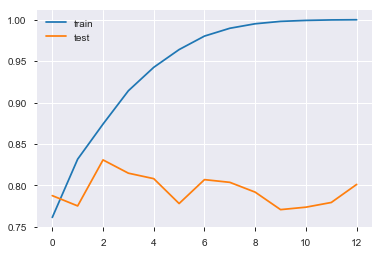

In [16]:
from sklearn.tree import DecisionTreeRegressor
train_scores=[]
test_scores=[]
for depth in range(3,16):
    reg_tree = DecisionTreeRegressor(max_depth=depth, random_state=42)
    reg_tree.fit(X_train, y_train)
    train_scores.append(reg_tree.score(X_train, y_train))
    test_scores.append(reg_tree.score(X_test, y_test))
plt.plot(train_scores)
plt.plot(test_scores)
plt.legend(["train","test"])

In [17]:
from sklearn.tree import DecisionTreeRegressor
dt = DecisionTreeRegressor(random_state=42, max_depth=5)
dt.fit(X_train, y_train)
dt_p = dt.predict(X_test)
dt_t = dt.predict(X_train)

result_dt = pd.DataFrame(X_test)
result_dt.columns = list(X)
result_dt['SalePrice'] = list(dt_p)
result_dt['SalePrice_real'] = list(y_test)

print_metrics(dt, dt_p)
print_metrics1(dt, X_1, y, n=3)

result_dt['diff'] = ((result_dt['SalePrice'] / result_dt['SalePrice_real']) - 1) * 100
result_dt['diff'] = result_dt['diff'].abs()
result_dt['diff_group'] = result_dt.apply(diff_range, axis=1)
result_dt['diff_group'].value_counts().sort_index()/len(result_dt)

predicted shape: (292,)
Train Mean: 181441.5419520548
Test Mean: 178839.81164383562
Model Mean: 177599.23270696425
Model MSE: 1297861607.5740366
Model Sqrt MSE: 36025.84638247985
Model R^2: 0.8307944704675095
Train score: 0.8740028343420457
Test score: 0.8307944704675095
Cross validation score: [0.76879006 0.81718334 0.75038529]
R^2 / Accuracy: 0.7804205186773508


1. <= 2%        0.092466
2. 2 <= 5%      0.181507
3. 5 <= 10%     0.232877
4. 10 <= 20%    0.294521
5. 20 <= 40%    0.147260
6. 40 <= 60%    0.017123
7. > 70%        0.034247
Name: diff_group, dtype: float64

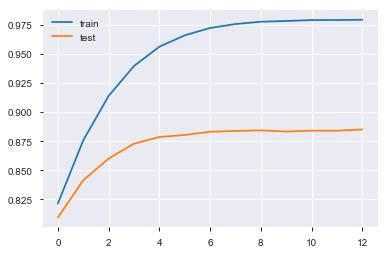

In [18]:
from sklearn.ensemble import RandomForestRegressor
train_scores=[]
test_scores=[]
for depth in range(3,16):
    rf = RandomForestRegressor(max_depth=depth, random_state=42, n_estimators=500)
    rf.fit(X_train, y_train)
    train_scores.append(rf.score(X_train, y_train))
    test_scores.append(rf.score(X_test, y_test))
plt.plot(train_scores)
plt.plot(test_scores)
plt.legend(["train","test"])    

In [15]:
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(max_depth=10, random_state=42, n_estimators=500)
rf.fit(X_train, y_train)
rf_p = rf.predict(X_test)
rf_t = rf.predict(X_train)

result_rf = pd.DataFrame(X_test)
result_rf.columns = list(X)
result_rf['SalePrice'] = list(rf_p)
result_rf['SalePrice_real'] = list(y_test)

print_metrics(rf, rf_p)
print_metrics1(rf, X_1, y, n=3)

result_rf['diff'] = ((result_rf['SalePrice'] / result_rf['SalePrice_real']) - 1) * 100
result_rf['diff'] = result_rf['diff'].abs()
result_rf['diff_group'] = result_rf.apply(diff_range, axis=1)
result_rf['diff_group'].value_counts().sort_index()/len(result_rf)

predicted shape: (292,)
Train Mean: 181441.5419520548
Test Mean: 178839.81164383562
Model Mean: 178552.10387314172
Model MSE: 890827961.2471559
Model Sqrt MSE: 29846.74121654081
Model R^2: 0.8838604855667747
Train score: 0.9756758736707285
Test score: 0.8838604855667747
Cross validation score: [0.89133898 0.85672992 0.82978907]
R^2 / Accuracy: 0.8593853088888024


1. <= 2%        0.195205
2. 2 <= 5%      0.232877
3. 5 <= 10%     0.256849
4. 10 <= 20%    0.181507
5. 20 <= 40%    0.099315
6. 40 <= 60%    0.017123
7. > 70%        0.017123
Name: diff_group, dtype: float64

In [19]:
importances = rf.feature_importances_

# train_features is the dataframe of training features
feature_list = list(X.columns)

# Extract the feature importances into a dataframe
feature_results = pd.DataFrame({'feature': feature_list, 'importance': importances})

# Show the top 10 most important
feature_results = feature_results.sort_values('importance', ascending = False).reset_index(drop=True)
feature_results.head(10)

,feature,importance
0,TotalFlrSF,0.409528
1,OverallQual,0.356103
2,2ndFlrSF,0.025932
3,YearBuilt,0.022771
4,LotArea,0.012721
5,BsmtFinSF1,0.012570
6,YearRemodAdd,0.011607
7,GrLivArea,0.011557
8,GarageCars,0.010930
9,LotFrontage,0.010851


In [37]:
from sklearn.metrics import max_error
residuals = metrics.max_error(y_test, list(rf_p))
wrong = X_test[np.argmax(residuals), :]
print("Max Residual Error: "+str(metrics.max_error(y_test, list(rf_p))))

Max Residual Error: 183832.43710119056


In [42]:
X.shape

(1460, 88)

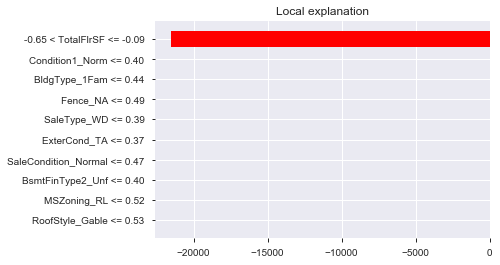

In [53]:
import lime.lime_tabular

explainer = lime.lime_tabular.LimeTabularExplainer(X_train,                                            
                 feature_names=feature_list,                                        
                 class_names=y_train,mode='regression')

exp = explainer.explain_instance(data_row = wrong, 
                                 predict_fn = rf.predict)

# Plot the prediction explaination
exp.as_pyplot_figure();

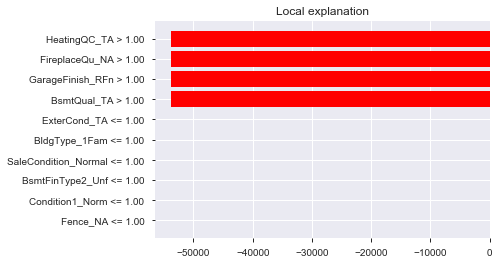

In [56]:
import lime.lime_tabular

feature_list = list(X.columns)

explainer = lime.lime_tabular.LimeTabularExplainer(X.values, feature_names=feature_list,                                        
                                                   mode='regression') # classification need class_names

exp = explainer.explain_instance(data_row = wrong, predict_fn = rf.predict)

exp.as_pyplot_figure();

# subtract -50k points from the prediction

In [58]:
exp.show_in_notebook()

In [33]:
import lightgbm as lgb

for leaf in [15, 20, 25, 30]:
    lgbm = lgb.LGBMRegressor(objective='regression',max_depth=-1, random_state=42, n_estimators=500,
                             learning_rate=0.05,num_leaves=leaf)
    lgbm.fit(X_train, y_train)
    lgbm_p = lgbm.predict(X_test)
    lgbm_t = lgbm.predict(X_train)

    result_lgb = pd.DataFrame(X_test)
    result_lgb.columns = list(X)
    result_lgb['SalePrice'] = list(lgbm_p)
    result_lgb['SalePrice_real'] = list(y_test)

    print("Model Sqrt MSE: "+str(math.sqrt(mean_squared_error(y_test, list(lgbm_p)))))
    print("Model R^2: "+str(metrics.r2_score(y_test, list(lgbm_p))))
    print("Train/ Test score: "+str(lgbm.score(X_train, y_train))+" "+str(lgbm.score(X_test, y_test)))    

Model Sqrt MSE: 29931.367589138335
Model R^2: 0.883200956314391
Train/ Test score: 0.9903757868792276 0.883200956314391
Model Sqrt MSE: 30598.18366040006
Model R^2: 0.8779388492710644
Train/ Test score: 0.9933491124953608 0.8779388492710644
Model Sqrt MSE: 30556.574013856545
Model R^2: 0.8782705988971619
Train/ Test score: 0.9941610428751249 0.8782705988971619
Model Sqrt MSE: 30894.690244668
Model R^2: 0.8755617610604839
Train/ Test score: 0.9946221366672889 0.8755617610604839


In [34]:
import lightgbm as lgb

for rate in [0.01, 0.05, 0.1]:
    lgbm = lgb.LGBMRegressor(objective='regression',max_depth=-1, random_state=42, n_estimators=500,
                             learning_rate=rate,num_leaves=25)
    lgbm.fit(X_train, y_train)
    lgbm_p = lgbm.predict(X_test)
    lgbm_t = lgbm.predict(X_train)

    result_lgb = pd.DataFrame(X_test)
    result_lgb.columns = list(X)
    result_lgb['SalePrice'] = list(lgbm_p)
    result_lgb['SalePrice_real'] = list(y_test)

    print("Model Sqrt MSE: "+str(math.sqrt(mean_squared_error(y_test, list(lgbm_p)))))
    print("Model R^2: "+str(metrics.r2_score(y_test, list(lgbm_p))))
    print("Train/ Test score: "+str(lgbm.score(X_train, y_train))+" "+str(lgbm.score(X_test, y_test)))  

Model Sqrt MSE: 31168.468147033593
Model R^2: 0.87334653306891
Train/ Test score: 0.9546993713909252 0.87334653306891
Model Sqrt MSE: 30556.574013856545
Model R^2: 0.8782705988971619
Train/ Test score: 0.9941610428751249 0.8782705988971619
Model Sqrt MSE: 30876.76339341803
Model R^2: 0.8757061314081005
Train/ Test score: 0.9993251561719948 0.8757061314081005


In [35]:
import lightgbm as lgb

for weight in [5,10,15,20,30]:
    lgbm = lgb.LGBMRegressor(objective='regression',max_depth=-1, random_state=42, n_estimators=500,
                             learning_rate=0.05,num_leaves=25,min_child_samples=weight)
    lgbm.fit(X_train, y_train)
    lgbm_p = lgbm.predict(X_test)
    lgbm_t = lgbm.predict(X_train)

    result_lgb = pd.DataFrame(X_test)
    result_lgb.columns = list(X)
    result_lgb['SalePrice'] = list(lgbm_p)
    result_lgb['SalePrice_real'] = list(y_test)

    print("Model Sqrt MSE: "+str(math.sqrt(mean_squared_error(y_test, list(lgbm_p)))))
    print("Model R^2: "+str(metrics.r2_score(y_test, list(lgbm_p))))
    print("Train/ Test score: "+str(lgbm.score(X_train, y_train))+" "+str(lgbm.score(X_test, y_test)))  

Model Sqrt MSE: 26651.45773063443
Model R^2: 0.9073963505616959
Train/ Test score: 0.9995125351214401 0.9073963505616959
Model Sqrt MSE: 27799.333996951933
Model R^2: 0.8992477047521176
Train/ Test score: 0.9987440862783368 0.8992477047521176
Model Sqrt MSE: 28443.942012722528
Model R^2: 0.8945210652885882
Train/ Test score: 0.9963064083619957 0.8945210652885882
Model Sqrt MSE: 30556.574013856545
Model R^2: 0.8782705988971619
Train/ Test score: 0.9941610428751249 0.8782705988971619
Model Sqrt MSE: 28670.50628035856
Model R^2: 0.8928340323255268
Train/ Test score: 0.9869808848033002 0.8928340323255268


In [38]:
import lightgbm as lgb

lgbm = lgb.LGBMRegressor(objective='regression',max_depth=-1, random_state=42, n_estimators=500,
                             learning_rate=0.05,num_leaves=25,min_child_samples=5)
lgbm.fit(X_train, y_train)
lgbm_p = lgbm.predict(X_test)
lgbm_t = lgbm.predict(X_train)

result_lgbm = pd.DataFrame(X_test)
result_lgbm.columns = list(X)
result_lgbm['SalePrice'] = list(lgbm_p)
result_lgbm['SalePrice_real'] = list(y_test)

print_metrics(lgbm, lgbm_p)
print_metrics1(lgbm, X_1, y, n=3)

result_lgbm['diff'] = ((result_lgbm['SalePrice'] / result_lgbm['SalePrice_real']) - 1) * 100
result_lgbm['diff'] = result_lgbm['diff'].abs()
result_lgbm['diff_group'] = result_lgbm.apply(diff_range, axis=1)
result_lgbm['diff_group'].value_counts().sort_index()/len(result_lgbm)

predicted shape: (292,)
Train Mean: 181441.5419520548
Test Mean: 178839.81164383562
Model Mean: 178154.61373136786
Model MSE: 710300199.1677936
Model Sqrt MSE: 26651.45773063443
Model R^2: 0.9073963505616959
Train score: 0.9995125351214401
Test score: 0.9073963505616959
Cross validation score: [0.87517207 0.8591784  0.82244207]
R^2 / Accuracy: 0.8527135843749882


1. <= 2%        0.188356
2. 2 <= 5%      0.250000
3. 5 <= 10%     0.250000
4. 10 <= 20%    0.222603
5. 20 <= 40%    0.058219
6. 40 <= 60%    0.017123
7. > 70%        0.013699
Name: diff_group, dtype: float64

In [15]:
import lightgbm as lgb

lgbm = lgb.LGBMRegressor(objective='regression',max_depth=-1, random_state=42, n_estimators=500,
                         learning_rate=0.05,num_leaves=25,min_child_samples=10)
lgbm.fit(X_train, y_train)
lgbm_p = lgbm.predict(X_test)
lgbm_t = lgbm.predict(X_train)

result_lgbm = pd.DataFrame(X_test)
result_lgbm.columns = list(X)
result_lgbm['SalePrice'] = list(lgbm_p)
result_lgbm['SalePrice_real'] = list(y_test)

print_metrics(lgbm, lgbm_p)
print_metrics1(lgbm, X_1, y, n=3)

result_lgbm['diff'] = ((result_lgbm['SalePrice'] / result_lgbm['SalePrice_real']) - 1) * 100
result_lgbm['diff'] = result_lgbm['diff'].abs()
result_lgbm['diff_group'] = result_lgbm.apply(diff_range, axis=1)
result_lgbm['diff_group'].value_counts().sort_index()/len(result_lgbm)

predicted shape: (292,)
Train Mean: 181441.5419520548
Test Mean: 178839.81164383562
Model Mean: 177699.06562484612
Model MSE: 772802970.6740875
Model Sqrt MSE: 27799.333996951933
Model R^2: 0.8992477047521176
Train score: 0.9987440862783368
Test score: 0.8992477047521176
Cross validation score: [0.88610847 0.86655539 0.82613342]
R^2 / Accuracy: 0.8600588935513475


1. <= 2%        0.222603
2. 2 <= 5%      0.215753
3. 5 <= 10%     0.273973
4. 10 <= 20%    0.191781
5. 20 <= 40%    0.065068
6. 40 <= 60%    0.017123
7. > 70%        0.013699
Name: diff_group, dtype: float64

In [39]:
import lightgbm as lgb

lgbm = lgb.LGBMRegressor(objective='regression',max_depth=-1, random_state=42, n_estimators=500,
                             learning_rate=0.05,num_leaves=25,min_child_samples=5)
lgbm.fit(X_train, y_train)
lgbm_p = lgbm.predict(X_test)
lgbm_t = lgbm.predict(X_train)

result_lgbm = pd.DataFrame(X_test)
result_lgbm.columns = list(X)
result_lgbm['SalePrice'] = list(lgbm_p)
result_lgbm['SalePrice_real'] = list(y_test)

print_metrics(lgbm, lgbm_p)
print_metrics1(lgbm, X_1, y, n=3)

result_lgbm['diff'] = ((result_lgbm['SalePrice'] / result_lgbm['SalePrice_real']) - 1) * 100
result_lgbm['diff'] = result_lgbm['diff'].abs()
result_lgbm['diff_group'] = result_lgbm.apply(diff_range, axis=1)
result_lgbm['diff_group'].value_counts().sort_index()/len(result_lgbm)

predicted shape: (292,)
Train Mean: 181441.5419520548
Test Mean: 178839.81164383562
Model Mean: 178154.61373136786
Model MSE: 710300199.1677936
Model Sqrt MSE: 26651.45773063443
Model R^2: 0.9073963505616959
Train score: 0.9995125351214401
Test score: 0.9073963505616959
Cross validation score: [0.87517207 0.8591784  0.82244207]
R^2 / Accuracy: 0.8527135843749882


1. <= 2%        0.188356
2. 2 <= 5%      0.250000
3. 5 <= 10%     0.250000
4. 10 <= 20%    0.222603
5. 20 <= 40%    0.058219
6. 40 <= 60%    0.017123
7. > 70%        0.013699
Name: diff_group, dtype: float64

In [41]:
import lightgbm as lgb

X_2 = pd.DataFrame(X_1)
X_2.columns = list(X)

lgbm = lgb.LGBMRegressor(objective='regression',max_depth=-1, random_state=42, n_estimators=500,
                         learning_rate=0.05,num_leaves=25,min_child_samples=10)
lgbm.fit(X_2, y)
booster = lgbm.booster_
importance = booster.feature_importance(importance_type='gain')
feature_name = booster.feature_name()
feature_importance0 = pd.DataFrame({'feature_name':feature_name,'importance':importance})
feature_importance = feature_importance0.query('importance!=0')
feature_importance = feature_importance.sort_values('importance',ascending=False)
print(np.sum(importance))
feature_importance[:10]

94254825467026.0


,feature_name,importance
3,OverallQual,3.976156e+13
35,TotalFlrSF,3.320497e+13
5,YearBuilt,1.768474e+12
8,BsmtFinSF1,1.745540e+12
34,TotalBath,1.463062e+12
23,GarageCars,1.446089e+12
2,LotArea,1.331903e+12
6,YearRemodAdd,1.330990e+12
24,GarageArea,1.129036e+12
15,GrLivArea,9.754474e+11


In [46]:
from scipy.stats import kstest 
x = kstest(lgbm_t, "norm")    
print(x) 

KstestResult(statistic=1.0, pvalue=0.0)


In [30]:
from sklearn.metrics import make_scorer, accuracy_score
import lightgbm as lgb
from sklearn.model_selection import GridSearchCV

lgbm = lgb.LGBMRegressor(objective='regression',max_depth=-1, random_state=42, n_estimators=500)

parameters = {
              'learning_rate' : [0.01, 0.05, 0.1],
              'min_child_samples' : [5,10,15,20,30],
              'num_leaves' : [15, 20, 25, 30],
              'boosting' : ['gbdt','dart'],
              'lambda_l1' : [0, 0.1, 0.3, 0.5],
              'lambda_l2' : [0, 10, 15, 20]
             }

grid_obj = GridSearchCV(lgbm, parameters, cv=3)
grid_obj = grid_obj.fit(X_train, y_train)

lgbm = grid_obj.best_estimator_
print(grid_obj.best_score_)
print(lgbm)

lgbm.fit(X_train, y_train)
lgbm_p = lgbm.predict(X_test)
lgbm_t = lgbm.predict(X_train)

result_lgbm = pd.DataFrame(X_test)
result_lgbm.columns = list(X)
result_lgbm['SalePrice'] = list(lgbm_p)
result_lgbm['SalePrice_real'] = list(y_test)

print_metrics(lgbm, lgbm_p)

result_lgbm['diff'] = ((result_lgbm['SalePrice'] / result_lgbm['SalePrice_real']) - 1) * 100
result_lgbm['diff'] = result_lgbm['diff'].abs()
result_lgbm['diff_group'] = result_lgbm.apply(diff_range, axis=1)
result_lgbm['diff_group'].value_counts().sort_index()/len(result_lgbm)

0.8734599834462682
LGBMRegressor(boosting='gbdt', boosting_type='gbdt', class_weight=None,
              colsample_bytree=1.0, importance_type='split', lambda_l1=0.5,
              lambda_l2=10, learning_rate=0.05, max_depth=-1,
              min_child_samples=15, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=500, n_jobs=-1, num_leaves=15,
              objective='regression', random_state=42, reg_alpha=0.0,
              reg_lambda=0.0, silent=True, subsample=1.0,
              subsample_for_bin=200000, subsample_freq=0)
predicted shape: (292,)
Train Mean: 181441.5419520548
Test Mean: 178839.81164383562
Model Mean: 178638.1068411736
Model MSE: 820345112.1372176
Model Sqrt MSE: 28641.667411958013
Model R^2: 0.8930495144563015
Train score: 0.9891942886375982
Test score: 0.8930495144563015


1. <= 2%        0.188356
2. 2 <= 5%      0.243151
3. 5 <= 10%     0.270548
4. 10 <= 20%    0.191781
5. 20 <= 40%    0.075342
6. 40 <= 60%    0.017123
7. > 70%        0.013699
Name: diff_group, dtype: float64

In [28]:
lgbm.fit(X_train, y_train)
lgbm_p = lgbm.predict(X_test)
lgbm_t = lgbm.predict(X_train)

result_lgbm = pd.DataFrame(X_test)
result_lgbm.columns = list(X)
result_lgbm['SalePrice'] = list(lgbm_p)
result_lgbm['SalePrice_real'] = list(y_test)

print_metrics(lgbm, lgbm_p)
print_metrics1(lgbm, X_1, y, n=3)

result_lgbm['diff'] = ((result_lgbm['SalePrice'] / result_lgbm['SalePrice_real']) - 1) * 100
result_lgbm['diff'] = result_lgbm['diff'].abs()
result_lgbm['diff_group'] = result_lgbm.apply(diff_range, axis=1)
result_lgbm['diff_group'].value_counts().sort_index()/len(result_lgbm)

predicted shape: (292,)
Train Mean: 181441.5419520548
Test Mean: 178839.81164383562
Model Mean: 179209.07057723688
Model MSE: 765267378.9880149
Model Sqrt MSE: 27663.466503459305
Model R^2: 0.9002301390687978
Train score: 0.9997424219796259
Test score: 0.9002301390687978
Cross validation score: [0.90061291 0.83986386 0.84780932]
R^2 / Accuracy: 0.8620658769558959


1. <= 2%        0.167808
2. 2 <= 5%      0.239726
3. 5 <= 10%     0.294521
4. 10 <= 20%    0.208904
5. 20 <= 40%    0.047945
6. 40 <= 60%    0.027397
7. > 70%        0.013699
Name: diff_group, dtype: float64

In [29]:
import lightgbm as lgb

lgbm = lgb.LGBMRegressor(boosting='gbdt', boosting_type='gbdt', class_weight=None,
              colsample_bytree=1.0, importance_type='split', learning_rate=0.1,
              max_depth=-1, min_child_samples=5, min_child_weight=0.001,
              min_split_gain=0.0, n_estimators=500, n_jobs=-1, num_leaves=15,
              objective='regression', random_state=42, reg_alpha=0.0,
              reg_lambda=0.0, silent=True, subsample=1.0,
              subsample_for_bin=200000, subsample_freq=0)
lgbm.fit(X_train, y_train)
lgbm_p = lgbm.predict(X_test)
lgbm_t = lgbm.predict(X_train)

result_lgbm = pd.DataFrame(X_test)
result_lgbm.columns = list(X)
result_lgbm['SalePrice'] = list(lgbm_p)
result_lgbm['SalePrice_real'] = list(y_test)

print_metrics(lgbm, lgbm_p)

result_lgbm['diff'] = ((result_lgbm['SalePrice'] / result_lgbm['SalePrice_real']) - 1) * 100
result_lgbm['diff'] = result_lgbm['diff'].abs()
result_lgbm['diff_group'] = result_lgbm.apply(diff_range, axis=1)
result_lgbm['diff_group'].value_counts().sort_index()/len(result_lgbm)

predicted shape: (292,)
Train Mean: 181441.5419520548
Test Mean: 178839.81164383562
Model Mean: 179209.07057723688
Model MSE: 765267378.9880149
Model Sqrt MSE: 27663.466503459305
Model R^2: 0.9002301390687978
Train score: 0.9997424219796259
Test score: 0.9002301390687978


1. <= 2%        0.167808
2. 2 <= 5%      0.239726
3. 5 <= 10%     0.294521
4. 10 <= 20%    0.208904
5. 20 <= 40%    0.047945
6. 40 <= 60%    0.027397
7. > 70%        0.013699
Name: diff_group, dtype: float64

In [49]:
from sklearn.model_selection import KFold, cross_val_score
kfolds = KFold(n_splits=10, shuffle=True, random_state=42)

def rmsle(y, y_pred):
    train_pred = np.sqrt(mean_squared_error(y_train, y_pred))
    test_pred = np.sqrt(mean_squared_error(y_test, y_pred))
    print(train_pred,test_pred)
    
def cv_rmse(model):
    rmse = np.sqrt(-cross_val_score(model, X_train, y_train, scoring="neg_mean_squared_error", cv=kfolds))
    return (rmse)

In [50]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.linear_model import RidgeCV, LassoCV

alphas_alt = [14.5, 14.6, 14.7, 14.8, 14.9, 15, 15.1, 15.2, 15.3, 15.4, 15.5]
ridge = make_pipeline(RobustScaler(), RidgeCV(alphas=alphas_alt, cv=kfolds))
score = cv_rmse(ridge)
print("Ridge: {:.4f} ({:.4f})\n".format(score.mean(), score.std()))
rmsle(y, y_pred)

Ridge: 32783.8466 (12113.5470)



NameError: name 'y_pred' is not defined

In [ ]:
alphas2 = [5e-05, 0.0001, 0.0002, 0.0003, 0.0004, 0.0005, 0.0006, 0.0007, 0.0008]
lasso = make_pipeline(RobustScaler(), LassoCV(max_iter=1e7, alphas=alphas2, random_state=42, cv=kfolds))
score = cv_rmse(lasso)
print("LASSO: {:.4f} ({:.4f})\n".format(score.mean(), score.std()))

In [ ]:
variance threshold 
Ridge: 31715.0485 (10529.0776)

# Bagging with DT improves the model
### Ch5 of Eric Li

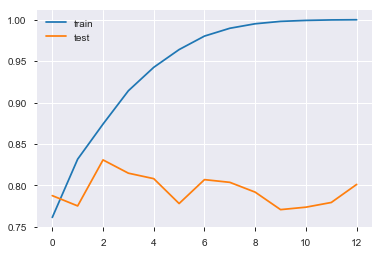

In [23]:
from sklearn.tree import DecisionTreeRegressor
train_scores=[]
test_scores=[]
for depth in range(3,16):
    reg_tree = DecisionTreeRegressor(max_depth=depth, random_state=42)
    reg_tree.fit(X_train, y_train)
    train_scores.append(reg_tree.score(X_train, y_train))
    test_scores.append(reg_tree.score(X_test, y_test))
plt.plot(train_scores)
plt.plot(test_scores)
plt.legend(["train","test"])

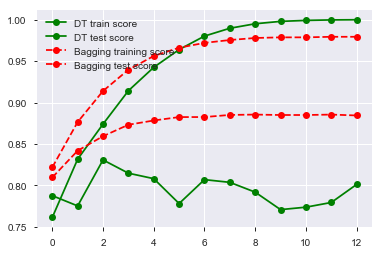

In [24]:
from sklearn.ensemble import BaggingRegressor

train_scores_b = []
test_scores_b = []
for depth in range(3,16):
    bag_tree = BaggingRegressor(DecisionTreeRegressor(max_depth=depth, random_state=42),
                                random_state=42, n_estimators=500)
    bag_tree.fit(X_train, y_train.values.ravel())
    train_scores_b.append(bag_tree.score(X_train, y_train))
    test_scores_b.append(bag_tree.score(X_test, y_test))

plt.plot(train_scores, 'go-')
plt.plot(test_scores, 'go-')
plt.plot(train_scores_b, 'ro--')
plt.plot(test_scores_b, 'ro--')
plt.legend(["DT train score","DT test score",
            "Bagging training score", "Bagging test score"])

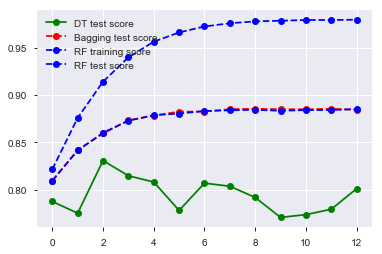

In [25]:
from sklearn.ensemble import RandomForestRegressor
train_scores_rf=[]
test_scores_rf=[]
for depth in range(3,16):
    rf = RandomForestRegressor(max_depth=depth, random_state=42, n_estimators=500)
    rf.fit(X_train, y_train)
    train_scores_rf.append(rf.score(X_train, y_train))
    test_scores_rf.append(rf.score(X_test, y_test))

plt.plot(test_scores, 'go-')
plt.plot(test_scores_b, 'ro--')
plt.plot(train_scores_rf, 'bo--')
plt.plot(test_scores_rf, 'bo--')
plt.legend(["DT test score","Bagging test score",
            "RF training score", "RF test score"])    

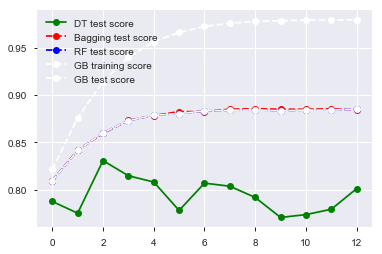

In [26]:
from sklearn.ensemble import GradientBoostingRegressor
train_scores_gb=[]
test_scores_gb=[]
for depth in range(3,16):
    gb = RandomForestRegressor(max_depth=depth, random_state=42, n_estimators=500)
    gb.fit(X_train, y_train)
    train_scores_gb.append(gb.score(X_train, y_train))
    test_scores_gb.append(gb.score(X_test, y_test))

plt.plot(test_scores, 'go-')
plt.plot(test_scores_b, 'ro--')
plt.plot(test_scores_rf, 'bo--')
plt.plot(train_scores_gb, 'wo--')
plt.plot(test_scores_gb, 'wo--')
plt.legend(["DT test score","Bagging test score", "RF test score",
            "GB training score", "GB test score"])    

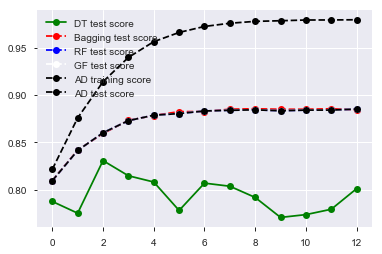

In [27]:
from sklearn.ensemble import AdaBoostRegressor
train_scores_ad=[]
test_scores_ad=[]
for depth in range(3,16):
    ad = RandomForestRegressor(max_depth=depth, random_state=42, n_estimators=500)
    ad.fit(X_train, y_train)
    train_scores_ad.append(ad.score(X_train, y_train))
    test_scores_ad.append(ad.score(X_test, y_test))

plt.plot(test_scores, 'go-')
plt.plot(test_scores_b, 'ro--')
plt.plot(test_scores_rf, 'bo--')
plt.plot(test_scores_gb, 'wo--')
plt.plot(train_scores_ad, 'ko--')
plt.plot(test_scores_ad, 'ko--')
plt.legend(["DT test score","Bagging test score", "RF test score", "GF test score",
            "AD training score", "AD test score"])    

In [28]:
# RF Tends to preform the best among GB, ADA, DF